# Intel Scenes Simple CNN

## Step 1 - Import Libraries

In [1]:
import warnings
warnings.simplefilter("ignore")

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pickle
import random
import shap
import torch
import torch.nn as nn
import torch.optim as optim

from pathlib import Path

SEED = 42
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
np.random.seed(SEED)
random.seed(SEED)      

print("PyTorch version:", torch.__version__)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", DEVICE)

PyTorch version: 2.5.1
device: cpu


In [3]:
import torchvision
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torch.utils.data import random_split, DataLoader, Subset

In [4]:
from utils import (
    GradCAM,
    SimpleCNN,
)

from utils import (
    get_class_names_from_idxs,
    plot_class_distribution,
    train_model,
    evaluate_model,
    plot_training_metrics,
    convert_np_to_tensor,
    model_predict,
)

from utils import (
    gradcam_explain_image,
    lime_explain_image,
    shap_explain_images
)

## Step 2 - Load the dataset

> Sample pictures colected from [https://www.kaggle.com/datasets/puneet6060/intel-image-classification?resource=download](https://www.kaggle.com/datasets/puneet6060/intel-image-classification)

In [5]:
PROJECT_DIR = "/Users/brusnto/Doutorado/XAI/ProjetoFinal"
DATASET_NAME = "intel_scenes"

DATA_ROOT = f"{PROJECT_DIR}/datasets/{DATASET_NAME}"
MODELS_PATH = f"{PROJECT_DIR}/models"
METRICS_PATH = f"{PROJECT_DIR}/metrics"

MODEL_FILE_NAME = f"{MODELS_PATH}/{DATASET_NAME}_simpleCNN.pth"
METRICS_FILE_NAME =  METRICS_PATH + "/{type}_" + DATASET_NAME + "_simpleCNN.pkl"

BATCH_SIZE = 64

print(f"Model file: {MODEL_FILE_NAME}")
print(f"Model file: {METRICS_FILE_NAME}")

Model file: /Users/brusnto/Doutorado/XAI/ProjetoFinal/models/intel_scenes_simpleCNN.pth
Model file: /Users/brusnto/Doutorado/XAI/ProjetoFinal/metrics/{type}_intel_scenes_simpleCNN.pkl


In [6]:
Path(MODELS_PATH).mkdir(parents=True, exist_ok=True)
Path(METRICS_PATH).mkdir(parents=True, exist_ok=True)

In [7]:
# Resize all images to 224x224
transform_image_resize = transforms.Compose([
    transforms.Resize(size = (224, 224)),
    transforms.ToTensor(),
])

In [8]:
# Read images
train_ds = datasets.ImageFolder(
    f"{DATA_ROOT}/train/",
    transform=transform_image_resize
)
test_ds = datasets.ImageFolder(
    f"{DATA_ROOT}/test/",
    transform=transform_image_resize
)

print(type(train_ds))

<class 'torchvision.datasets.folder.ImageFolder'>


In [9]:
CLASS_TO_IDX_MAP = train_ds.class_to_idx
CLASS_NAMES = list(CLASS_TO_IDX_MAP.keys())
N_CLASSES = len(CLASS_NAMES)

CLASS_TO_IDX_MAP

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

In [10]:
# Extract validation set
train_size = int(0.8 * len(train_ds))
val_size = len(train_ds) - train_size
train_ds, val_ds = random_split(train_ds, [train_size, val_size])

In [11]:
train_indices = list(range(len(train_ds)))
random.shuffle(train_indices)

val_indices = list(range(len(val_ds)))
random.shuffle(val_indices)

test_indices = list(range(len(test_ds)))
random.shuffle(test_indices)

train_subset_indices = train_indices[:2500]
val_subset_indices = val_indices[:1000]
test_subset_indices = test_indices[:1000]

train_subset = Subset(train_ds, train_subset_indices)
val_subset = Subset(val_ds, val_subset_indices)
test_subset = Subset(test_ds, test_subset_indices)

In [12]:
train_loader = DataLoader(
    train_subset,
    batch_size=BATCH_SIZE,
    shuffle=True
)
val_loader = DataLoader(
    val_subset,
    batch_size=BATCH_SIZE,
    shuffle=True
)
test_loader = DataLoader(
    test_subset,
    batch_size=BATCH_SIZE,
    shuffle=True
)
print(type(train_loader))

<class 'torch.utils.data.dataloader.DataLoader'>


In [13]:
total_train = len(train_loader.dataset)
total_val = len(val_loader.dataset)
total_test = len(test_loader.dataset)

print(f"Train: {total_train}")
print(f"Validation: {total_val}")
print(f"Test: {total_test}")
print(f"Total: {total_train + total_val + total_test}")

Train: 2500
Validation: 1000
Test: 1000
Total: 4500


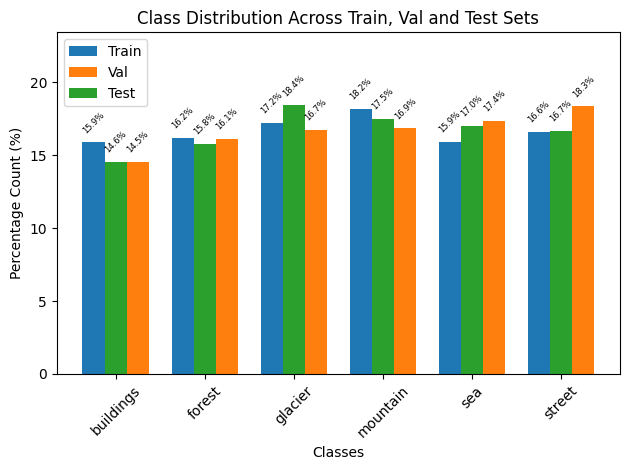

In [14]:
plot_class_distribution(train_ds, val_ds, test_ds, CLASS_NAMES)

In [15]:
sample_train_images, sample_train_torch_labels = next(iter(train_loader))

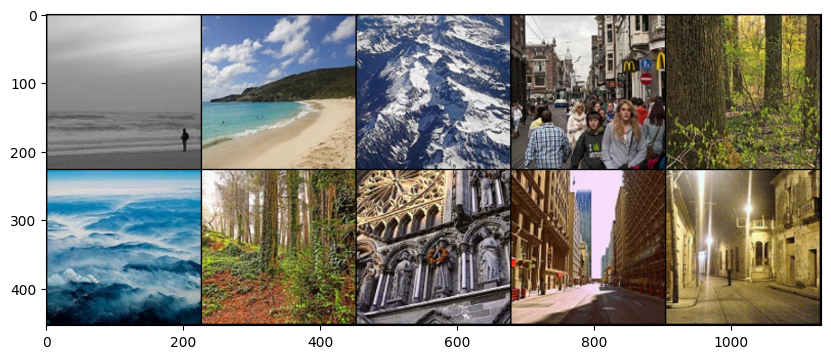

<class 'torch.Tensor'>


In [16]:
# Print 10 first training images
sample_train_images = sample_train_images[:10]
sample_train_torch_labels = sample_train_torch_labels[:10]
grid_img = make_grid(sample_train_images, 5)

%matplotlib inline
plt.figure(figsize = (10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()
print(type(sample_train_images))

## Step 3 - Train CNN

In [17]:
model = SimpleCNN(N_CLASSES).to(DEVICE)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-3)

In [18]:
LOAD_MODEL = False

In [19]:
if LOAD_MODEL:
    model.load_state_dict(torch.load(MODEL_FILE_NAME, map_location=DEVICE))
    # Load the dictionaries from pickle files
    with open(METRICS_FILE_NAME.format(type="train"), "rb") as train_file:
        train_metrics = pickle.load(train_file)
    with open(METRICS_FILE_NAME.format(type="val"), "rb") as val_file:
        val_metrics = pickle.load(val_file)
else:
    train_metrics, val_metrics = train_model(
        model, train_loader, val_loader, criterion, optimizer, DEVICE, CLASS_NAMES, MODEL_FILE_NAME
    )
    # Save the dictionaries as pickle files
    with open(METRICS_FILE_NAME.format(type="train"), "wb") as train_file:
        pickle.dump(train_metrics, train_file)
    with open(METRICS_FILE_NAME.format(type="val"), "wb") as val_file:
        pickle.dump(val_metrics, val_file)

==> Training starts!
Epoch 1/30


Training Loss: 1.2799, Accuracy: 0.4948, Precision: 0.4869, Recall: 0.4948, F1-Score: 0.4837


Validation Loss: 1.4089, Accuracy: 0.4550, Precision: 0.6067, Recall: 0.4550, F1-Score: 0.4103

Epoch 2/30


Training Loss: 0.9442, Accuracy: 0.6320, Precision: 0.6230, Recall: 0.6320, F1-Score: 0.6235


Validation Loss: 1.0546, Accuracy: 0.5930, Precision: 0.6769, Recall: 0.5930, F1-Score: 0.5735

Epoch 3/30


Training Loss: 0.8111, Accuracy: 0.6784, Precision: 0.6767, Recall: 0.6784, F1-Score: 0.6767


Validation Loss: 0.9926, Accuracy: 0.6200, Precision: 0.6686, Recall: 0.6200, F1-Score: 0.6195

Epoch 4/30


Training Loss: 0.6319, Accuracy: 0.7660, Precision: 0.7655, Recall: 0.7660, F1-Score: 0.7657


Validation Loss: 1.2295, Accuracy: 0.5660, Precision: 0.6168, Recall: 0.5660, F1-Score: 0.5548

Early stopping counter: 1/3 

Epoch 5/30


Training Loss: 0.7603, Accuracy: 0.7000, Precision: 0.6987, Recall: 0.7000, F1-Score: 0.6992


Validation Loss: 1.4061, Accuracy: 0.5210, Precision: 0.6771, Recall: 0.5210, F1-Score: 0.4766

Early stopping counter: 2/3 

Epoch 6/30


Training Loss: 0.5203, Accuracy: 0.8036, Precision: 0.8072, Recall: 0.8036, F1-Score: 0.8048


Validation Loss: 1.4649, Accuracy: 0.5090, Precision: 0.6270, Recall: 0.5090, F1-Score: 0.4895

Early stopping counter: 3/3 

Early stopping triggered. 

==> Training complete!
Final model saved at: /Users/brusnto/Doutorado/XAI/ProjetoFinal/models/intel_scenes_simpleCNN.pth


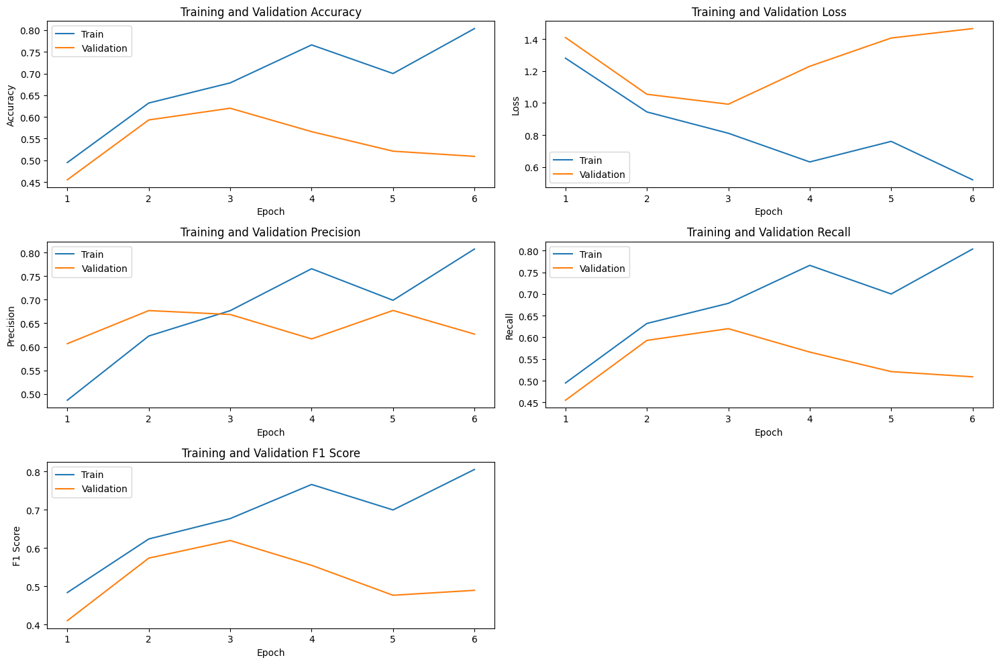

In [20]:
plot_training_metrics(train_metrics, val_metrics)

## Step 4 - Evaluate CNN

In [21]:
test_loss, test_accuracy, test_precision, test_recall, test_f1 = evaluate_model(
    model, test_loader, criterion, DEVICE, CLASS_NAMES, print_cf_report=True
)

print("\nTest Results:")
print(f"Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}, Precision: {test_precision:.4f}, Recall: {test_recall:.4f}, F1-Score: {test_f1:.4f}")

              precision    recall  f1-score   support

   buildings       0.64      0.39      0.48       152
      forest       0.69      0.77      0.73       146
     glacier       0.61      0.14      0.23       176
    mountain       0.67      0.47      0.55       184
         sea       0.32      0.90      0.47       177
      street       0.75      0.33      0.46       165

    accuracy                           0.50      1000
   macro avg       0.61      0.50      0.49      1000
weighted avg       0.61      0.50      0.48      1000


Test Results:
Test Loss: 1.5420, Accuracy: 0.4980, Precision: 0.6096, Recall: 0.4980, F1-Score: 0.4821


## Step 5 - Predict Sample Images

In [22]:
sample_images, sample_torch_labels = next(iter(test_loader))
sample_images_dicts = [''] * len(sample_images)

for i in range(len(sample_images)):
    sample_images_dicts[i] = {}
    sample_images_dicts[i]['image'] = sample_images[i]
    sample_images_dicts[i]['label'] = get_class_names_from_idxs(sample_torch_labels[i], CLASS_TO_IDX_MAP)[0]
    predicted = np.argmax(model_predict(model, sample_images[i], DEVICE))
    sample_images_dicts[i]['pred_label'] = get_class_names_from_idxs(predicted, CLASS_TO_IDX_MAP)[0]

In [23]:
sample_images, sample_torch_labels = next(iter(test_loader))
sample_images_dicts = [''] * len(sample_images)

for i in range(len(sample_images)):
    sample_images_dicts[i] = {}
    sample_images_dicts[i]['image'] = sample_images[i]
    sample_images_dicts[i]['label'] = get_class_names_from_idxs(sample_torch_labels[i], CLASS_TO_IDX_MAP)[0]
    predicted = np.argmax(model_predict(model, sample_images[i], DEVICE))
    sample_images_dicts[i]['pred_label'] = get_class_names_from_idxs(predicted, CLASS_TO_IDX_MAP)[0]

## Step 6 - Retrieve LIME Explanation

In [24]:
SAMPLE_TEST_IMAGE_INDEXES = [0, 2, 3, 5, 8, 14, 19]

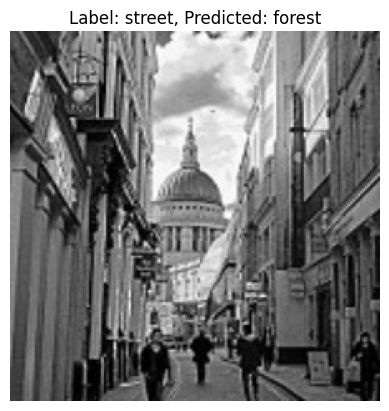

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 84.20it/s]


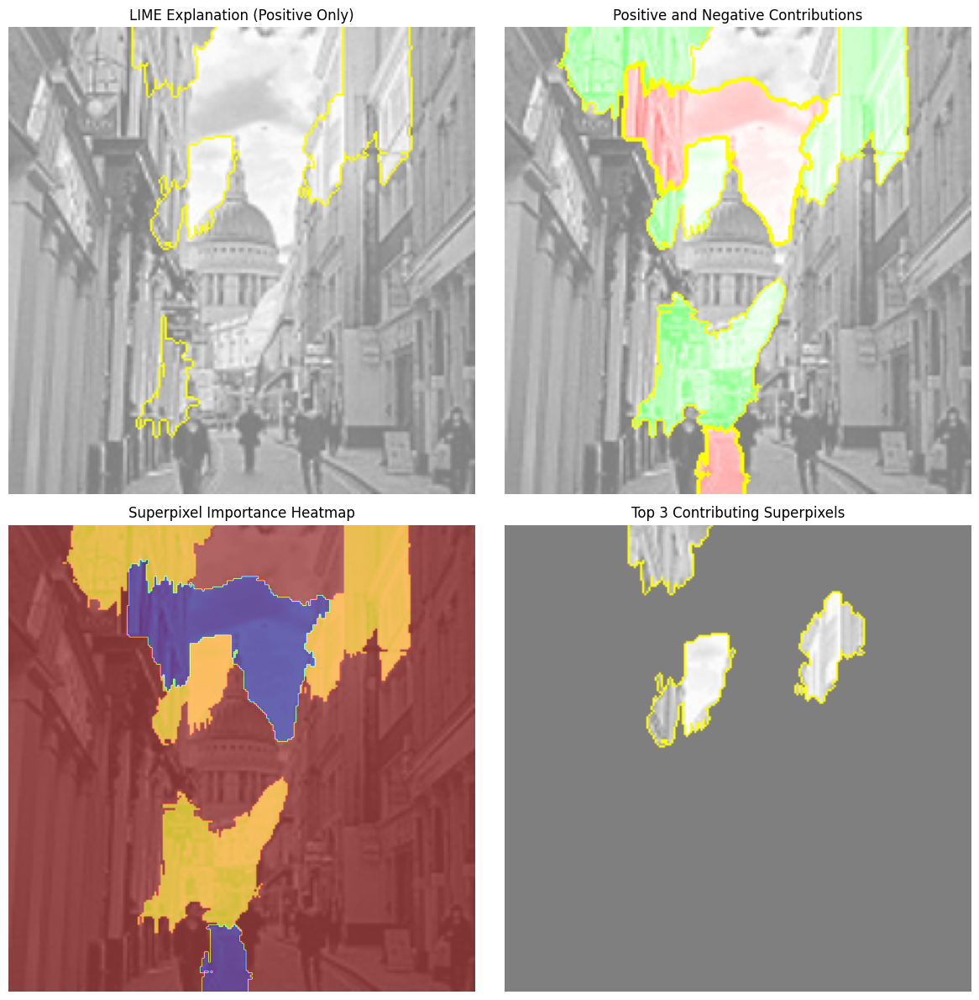

------------------------------------------------------------------------------------------------------------------------


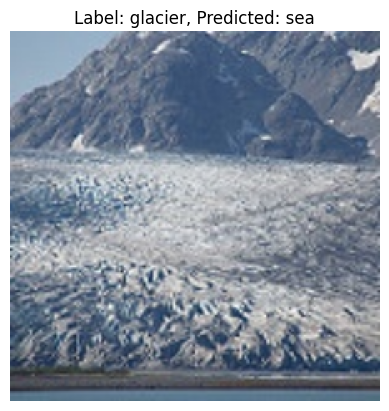

100%|███████████████████████████████████████| 1000/1000 [00:12<00:00, 81.18it/s]


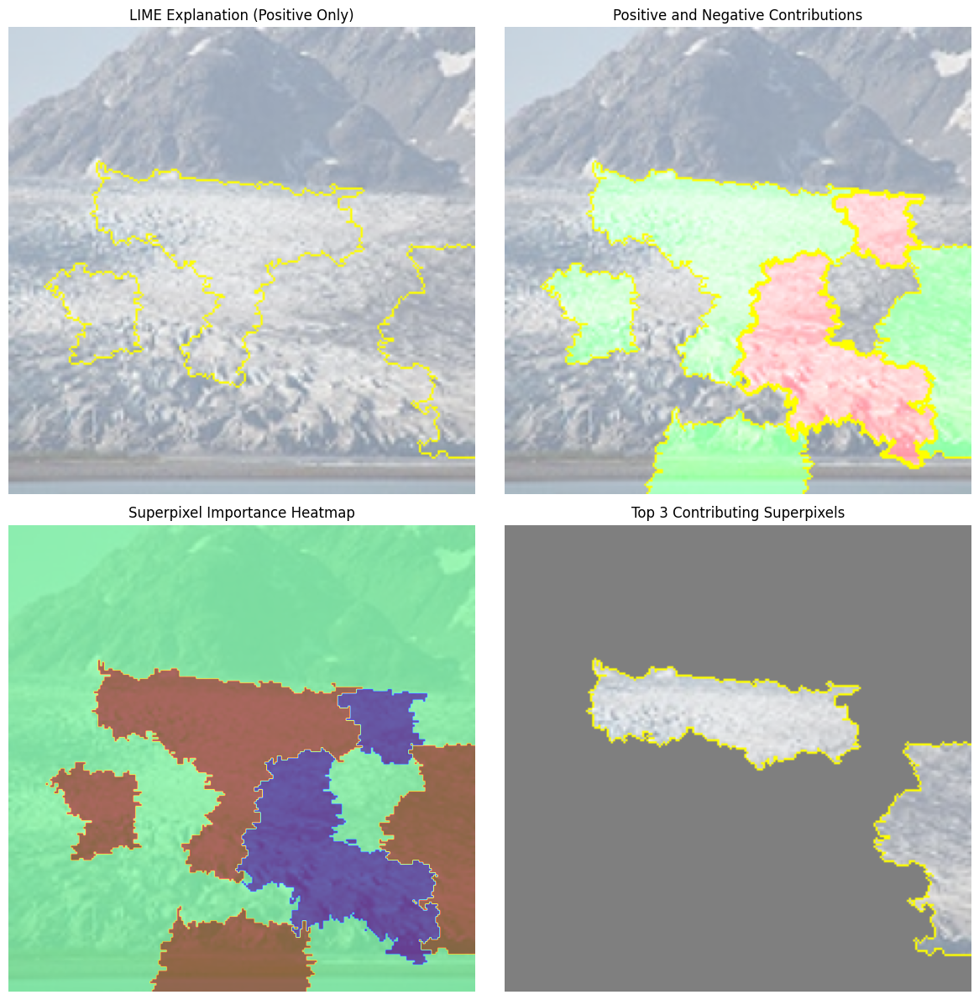

------------------------------------------------------------------------------------------------------------------------


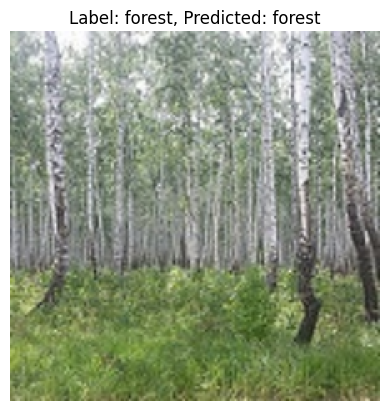

100%|███████████████████████████████████████| 1000/1000 [00:12<00:00, 82.43it/s]


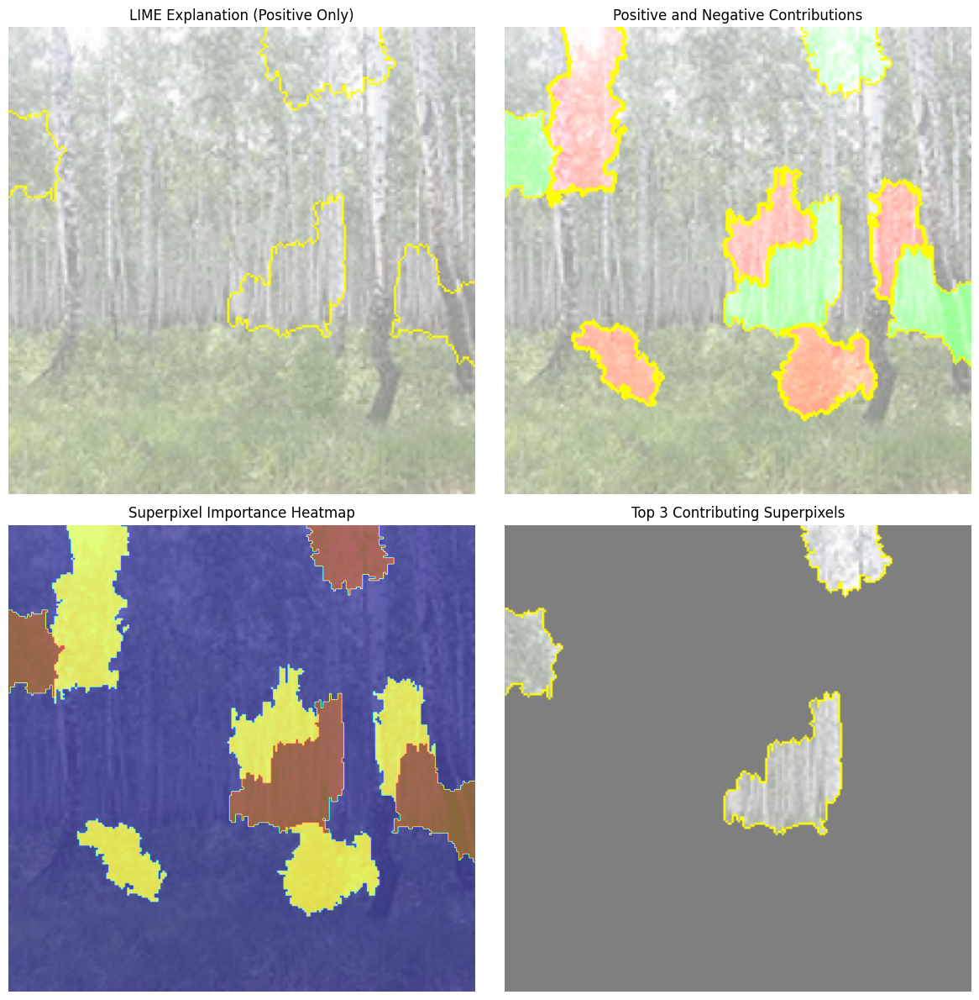

------------------------------------------------------------------------------------------------------------------------


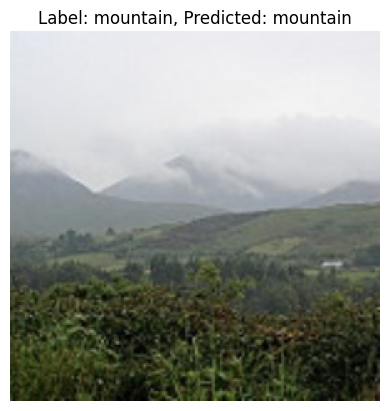

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 85.98it/s]


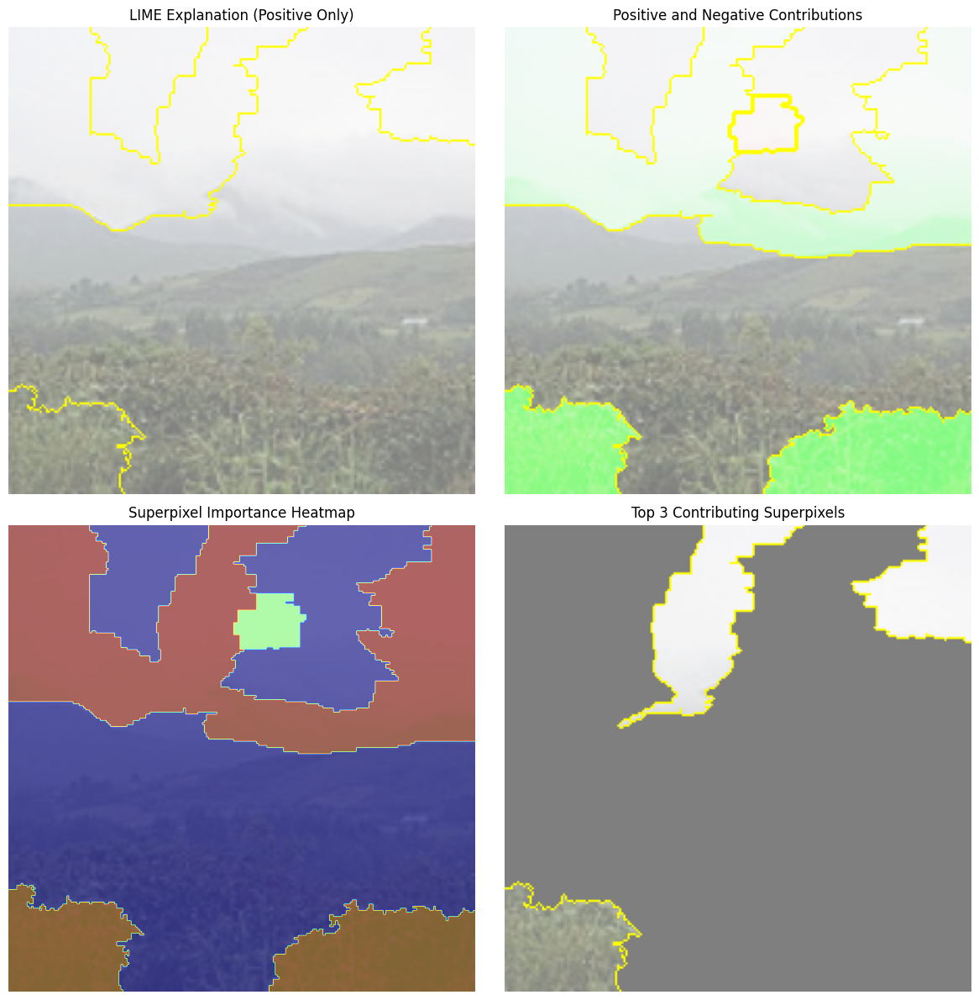

------------------------------------------------------------------------------------------------------------------------


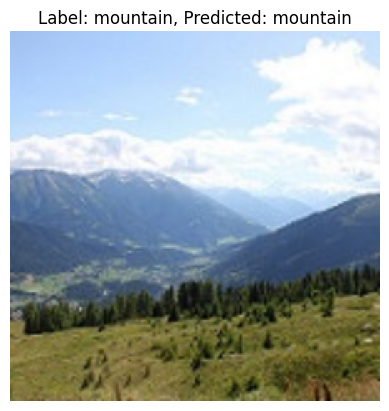

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 90.25it/s]


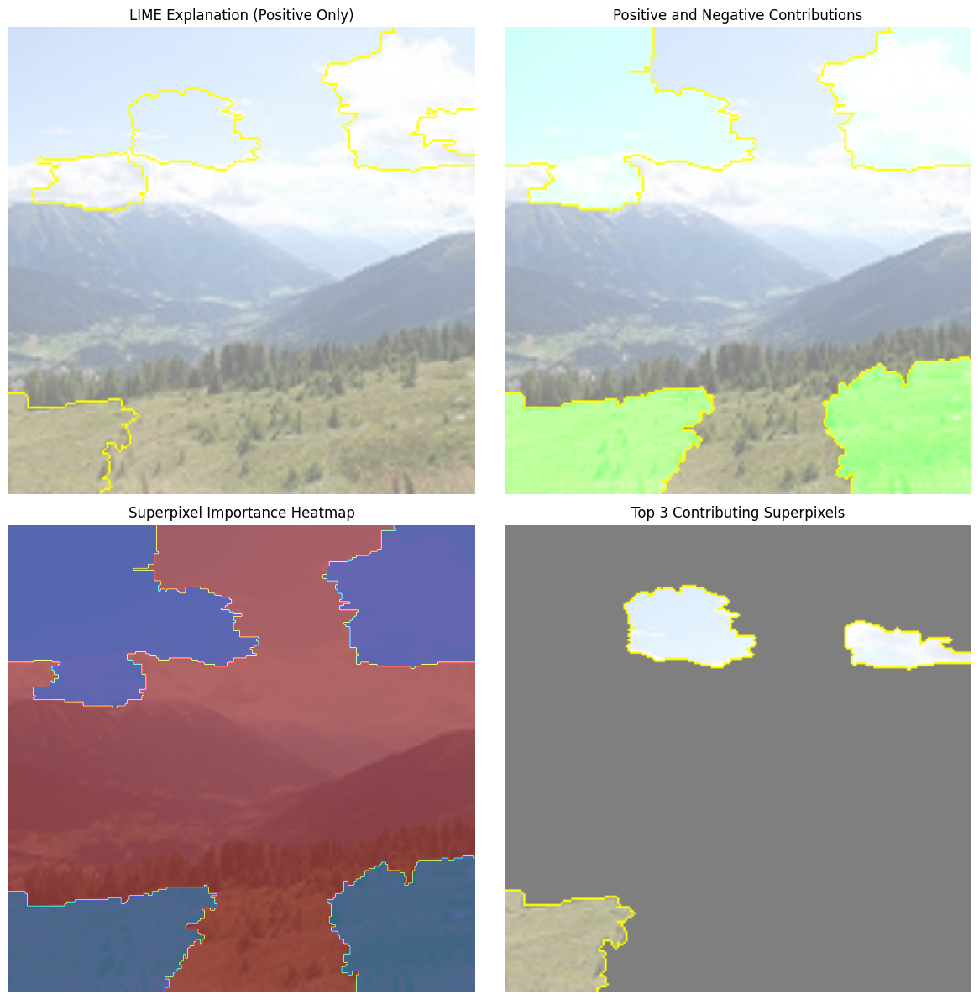

------------------------------------------------------------------------------------------------------------------------


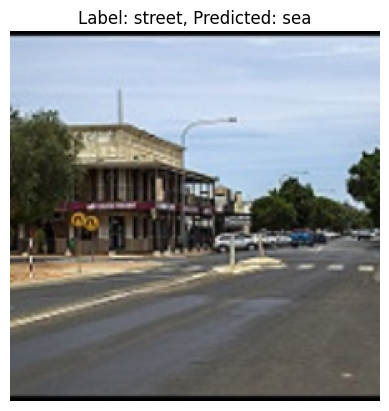

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 92.40it/s]


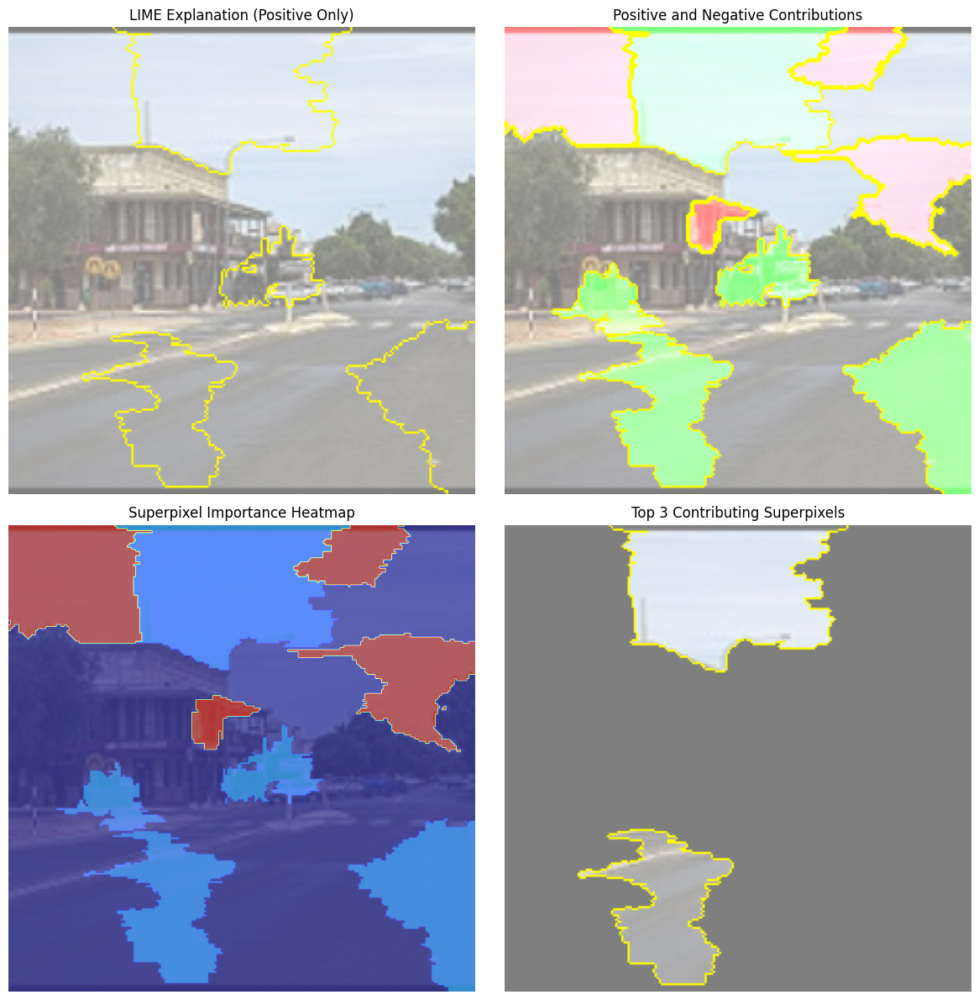

------------------------------------------------------------------------------------------------------------------------


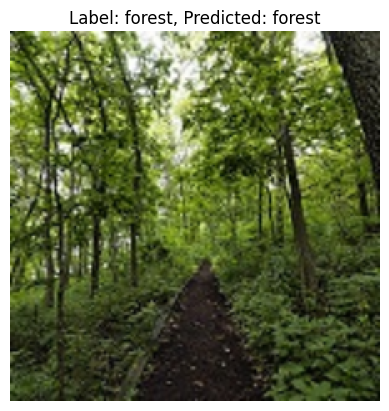

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 87.27it/s]


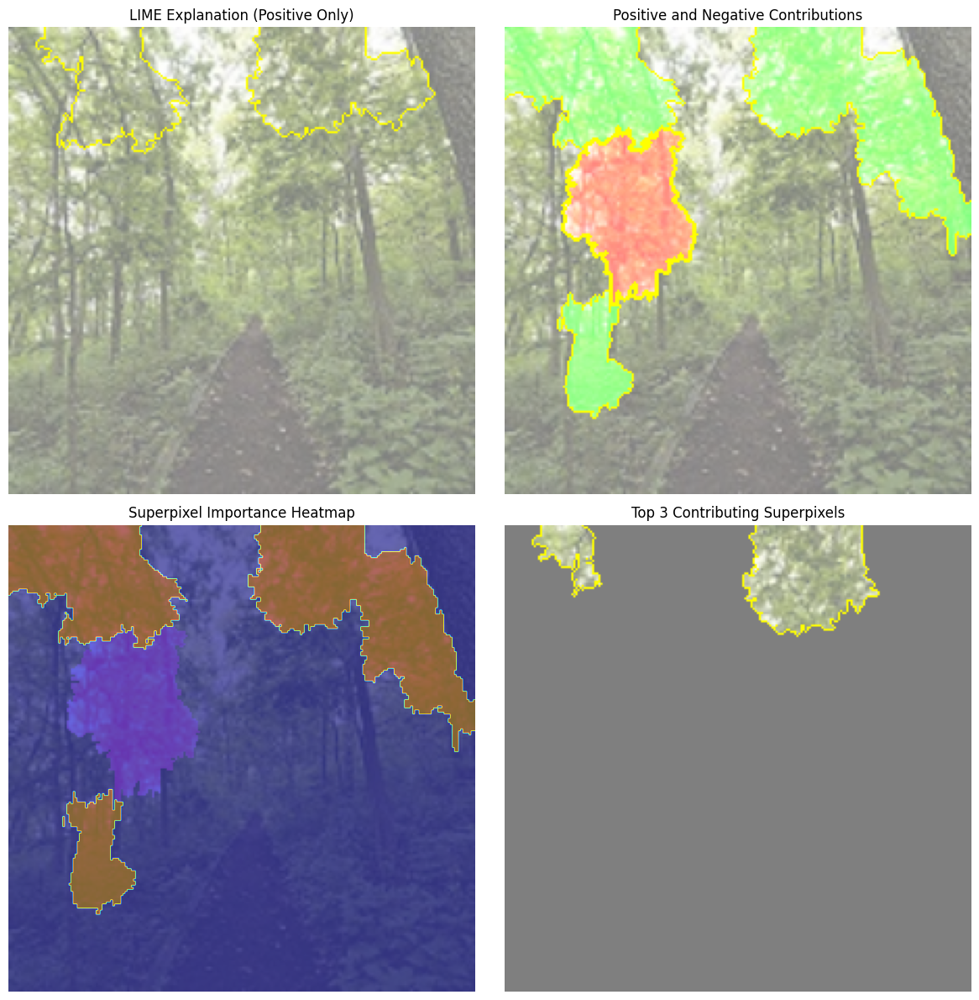

------------------------------------------------------------------------------------------------------------------------


In [25]:
for i in SAMPLE_TEST_IMAGE_INDEXES:
    lime_explain_image(model, sample_images_dicts[i], N_CLASSES, DEVICE)
    print("--------" * 15)

## Step 7 - Retrieve SHAP Explanation

In [26]:
shap_sample_images = []
shap_test_labels = []
for i in SAMPLE_TEST_IMAGE_INDEXES:
    shap_sample_images.append(sample_images_dicts[i]['image'])
    shap_test_labels.append(sample_images_dicts[i]['label'])
shap_sample_images = torch.stack(shap_sample_images)

In [27]:
shap_explainer = shap.DeepExplainer(model, sample_train_images)

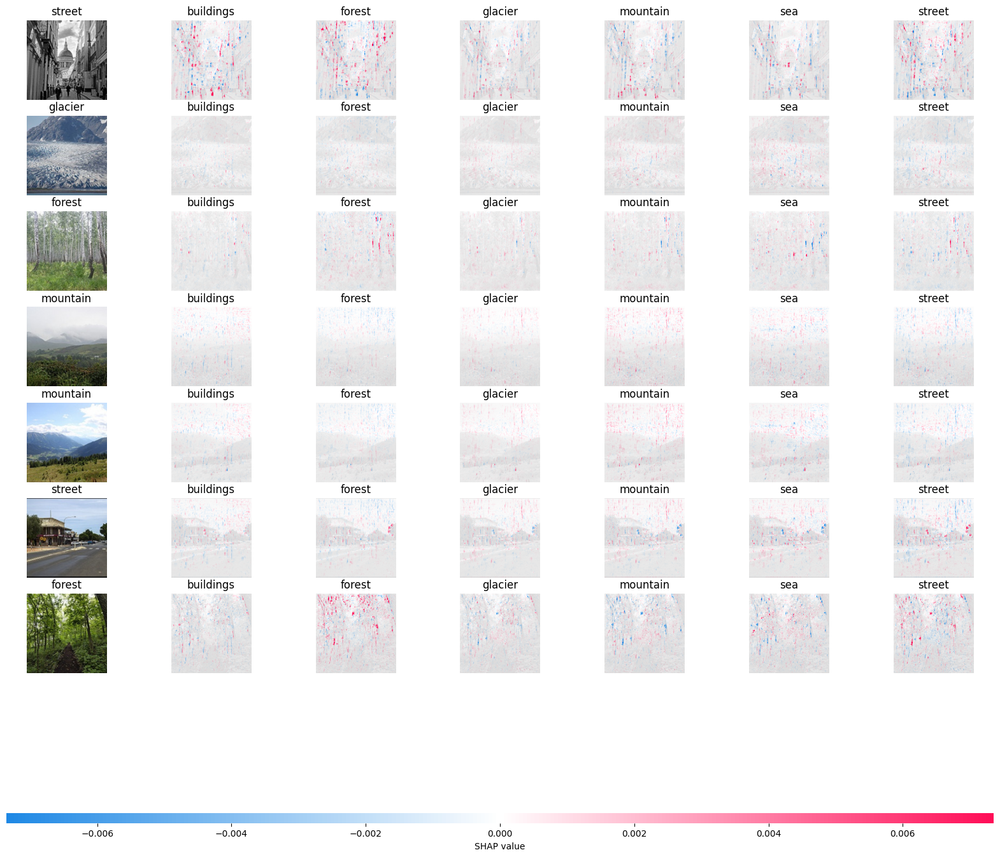

In [28]:
shap_explain_images(shap_explainer, CLASS_NAMES, shap_sample_images, shap_test_labels)

## Step 8 - Retrieve GradCAM Explanation

In [29]:
gradcam = GradCAM(model, target_layer='conv_section.7')

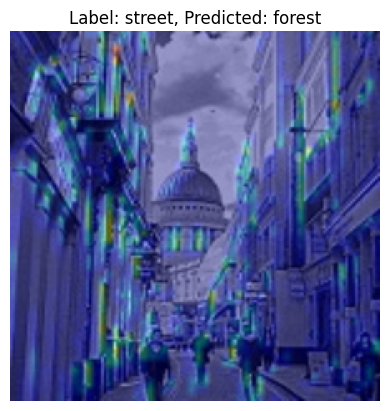

------------------------------------------------------------------------------------------------------------------------


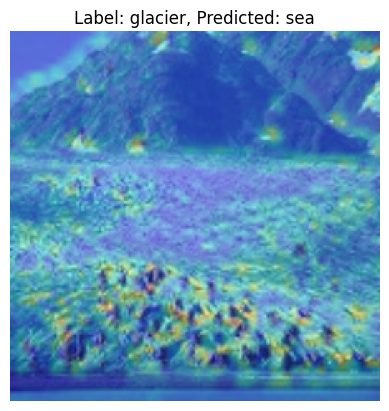

------------------------------------------------------------------------------------------------------------------------


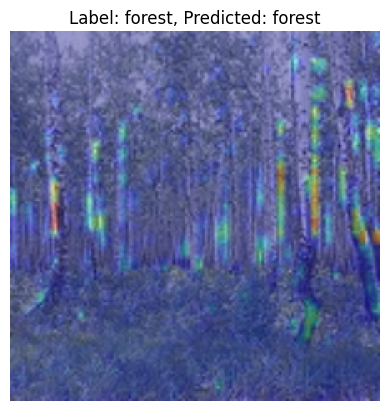

------------------------------------------------------------------------------------------------------------------------


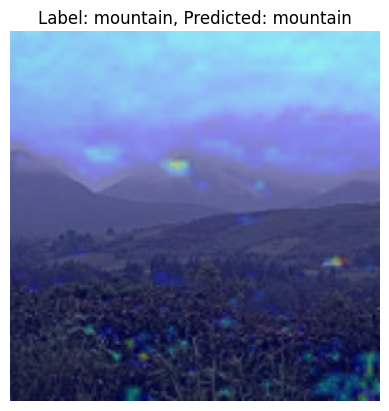

------------------------------------------------------------------------------------------------------------------------


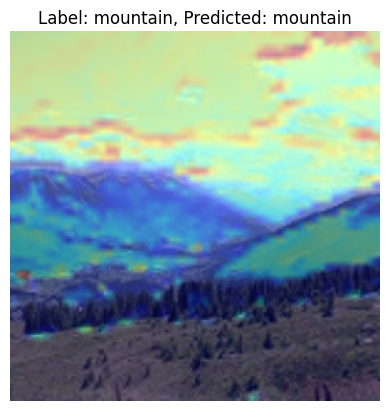

------------------------------------------------------------------------------------------------------------------------


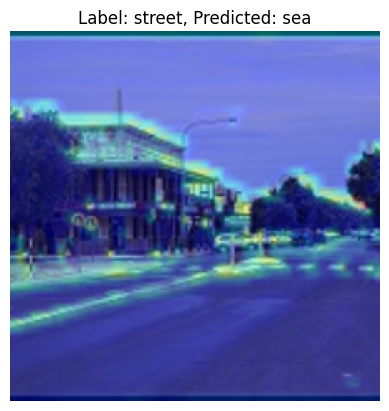

------------------------------------------------------------------------------------------------------------------------


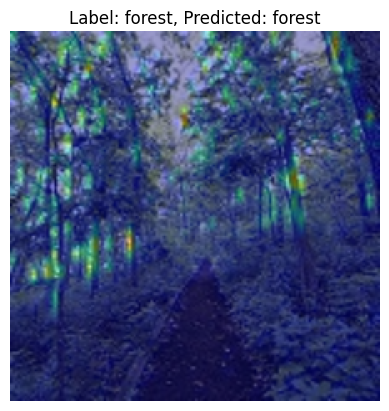

------------------------------------------------------------------------------------------------------------------------


In [30]:
for i in SAMPLE_TEST_IMAGE_INDEXES:
    heatmap = gradcam.generate_heatmap(sample_images_dicts[i]['image'], DEVICE)
    gradcam_explain_image(sample_images_dicts[i], heatmap)
    print("--------" * 15)